In [11]:
skip_pip = True  # TODO(ofekp): this should be removed

is_colab = True
try:
    from google.colab import drive
    print("Running on Google Colab")
except:
    print("Running locally")
    is_colab = False
    
if not skip_pip:
    # pip install
    for pkg in ['matplotlib',
                'sklearn',
                'tensorflow',     # required by by keras
                'keras',
                'pandas',
                'opencv-python',  # cv2
                'cython',         # required by pycocotools
                'timm',
                'omegaconf',
                'timm']:          # originally was - !pip install -U timm --user
        !pip install -U $pkg

    # torchvision
    # I made a change in torchvision library, so it needs to be compiled from the source code
    # I could not make this work on windows, for linux (ubuntu) use this:
    !sudo apt install build-essential
    !pip install torch --use-feature=2020-resolver
    !pip install ninja --use-feature=2020-resolver
    !pip install git+https://github.com/ofekp/vision.git --use-feature=2020-resolver

    # Install coco_utils
    # Win10: 
    #       !pip install cython
    #       now follow this guide (Exactly!): https://github.com/philferriere/cocoapi
    #       update: I fixed support for numpy > 1.17 due to error "'numpy.float64' object cannot be interpreted as an integer"
    #       to include it use my git repo "pip install git+https://github.com/ofekp/cocoapi.git#subdirectory=PythonAPI"
    #       make sure to remove the previous version before installing from my branch by using "pip uninstall pycocotools"
    #
    # Colab/Linux: 
    !pip install cython
    !pip install -U git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI

    # TODO(ofekp): this is probably not needed
    # Install segmentation package
    !pip install -U segmentation-models-pytorch albumentations --user

    # TODO(ofekp): This is not needed since I made a change and the code is now directly in the folder
    # https://github.com/nalepae/bounding-box.git
    # !pip install bounding-box
    # !git clone https://github.com/nalepae/bounding-box.git
    # !pip uninstall -y bounding-box

import torchvision
import torchvision.transforms as transforms
import torch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm as cm
import numpy as np
import json
import math
import re
from torch import nn, optim
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data.sampler import SubsetRandomSampler
import warnings
from sklearn import svm
from keras.datasets import fashion_mnist
import pandas as pd
import joblib
import os
import random
import time
import multiprocessing
from multiprocessing import Process, Pool, Queue, Lock, Value
import itertools
import pickle
import importlib
from PIL import Image
import effdet
from effdet import BiFpn, DetBenchTrain

current_time_millis = lambda: int(round(time.time() * 1000))

# imports for segmentation
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

warnings.filterwarnings('ignore')

# connect to Google Drive
if is_colab:
    from google.colab import drive
    from google.colab import files
    drive.mount('/content/gdrive')
    print("Folder content:")
    main_folder_path = '/content/gdrive/Shared drives/project_200446375_204031231/'
    main_folder_path_escaped = main_folder_path.replace(" ", "\ ")
    !ls $main_folder_path_escaped
    ofek_code_folder_imports = '/content/gdrive/Shared drives/project_200446375_204031231/code_ofek/*.{py,ttf}'
    ofek_code_folder_imports = ofek_code_folder_imports.replace(" ", "\ ")
    !cp $ofek_code_folder_imports .
    ofek_code_object_detecion_folder_imports = '/content/gdrive/Shared drives/project_200446375_204031231/code_ofek/object_detection/'
    ofek_code_object_detecion_folder_imports = ofek_code_object_detecion_folder_imports.replace(" ", "\ ")
    !cp -R $ofek_code_object_detecion_folder_imports .
else:
    main_folder_path = '../'
    %matplotlib inline
    # for local run, make the notebook wider with this code
    from IPython.core.display import display, HTML
    display(HTML("<style>.container { width:90% !important; }</style>"))
    pd.set_option('display.max_rows', 500)
    pd.set_option('display.max_columns', 500)
    pd.set_option('display.width', 150)

# imports external packages (from folder)
import bounding_box as bbx
import worker
import utils
import transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor, MaskRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.ops import MultiScaleRoIAlign
from torchvision.ops import misc as misc_nn_ops
import pycocotools
import coco_utils, coco_eval, engine, utils
# import efficientdet
# import efficientdet_utils
# import efficientdet_config_model
from timm.models.layers import get_act_layer
from timm import create_model
# import bench

# seeds
# following is needed for reproducibility
# refer to https://pytorch.org/docs/stable/notes/randomness.html
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
seed = 1
np.random.seed(seed)
torch.manual_seed(seed)

!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

Running locally


memory.used [MiB], memory.free [MiB], memory.total [MiB]
1775 MiB, 6204 MiB, 7979 MiB


# Shard the images into folders (DO NOT RUN THIS!!!)

In [ ]:
# generate the prefixes
!for f in /content/gdrive/Shared\ drives/project_200446375_204031231/Data/train/*; do echo $f | cut -d'/' -f8 | cut -c1-2; done > /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/prefixes
!cat /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/prefixes | sort | uniq > /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/prefixes_uniq
!rm /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/prefixes
!cat /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/prefixes_uniq | tr '\n' ' '

00
01
02
03
04
05
06
07
08
09
0a
0b
0c
0d
0e
0f
10
11
12
13
14
15
16
17
18
19
1a
1b
1c
1d
1e
1f
20
21
22
23
24
25
26
27
28
29
2a
2b
2c
2d
2e
2f
30
31
32
33
34
35
36
37
38
39
3a
3b
3c
3d
3e
3f
40
41
42
43
44
45
46
47
48
49
4a
4b
4c
4d
4e
4f
50
51
52
53
54
55
56
57
58
59
5a
5b
5c
5d
5e
5f
60
61
62
63
64
65
66
67
68
69
6a
6b
6c
6d
6e
6f
70
71
72
73
74
75
76
77
78
79
7a
7b
7c
7d
7e
7f
80
81
82
83
84
85
86
87
88
89
8a
8b
8c
8d
8e
8f
90
91
92
93
94
95
96
97
98
99
9a
9b
9c
9d
9e
9f
a0
a1
a2
a3
a4
a5
a6
a7
a8
a9
aa
ab
ac
ad
ae
af
b0
b1
b2
b3
b4
b5
b6
b7
b8
b9
ba
bb
bc
bd
be
bf
c0
c1
c2
c3
c4
c5
c6
c7
c8
c9
ca
cb
cc
cd
ce
cf
d0
d1
d2
d3
d4
d5
d6
d7
d8
d9
da
db
dc
dd
de
df
e0
e1
e2
e3
e4
e5
e6
e7
e8
e9
ea
eb
ec
ed
ee
ef
f0
f1
f2
f3
f4
f5
f6
f7
f8
f9
fa
fb
fc
fd
fe
ff


In [ ]:
# shard the train images
!for prefix in $(cat /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/prefixes_uniq); do echo "prefix: $prefix"; mkdir /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/$prefix; cp /content/gdrive/Shared\ drives/project_200446375_204031231/Data/train/$prefix* /content/gdrive/Shared\ drives/project_200446375_204031231/Data/shard/train/$prefix; done

total 1404428
-rw------- 1 root root      39023 Jun  6 13:59 label_descriptions.json
-rw------- 1 root root     156844 Jun  6 13:46 sample_submission.csv
drwx------ 3 root root       4096 Jul 18 11:53 shard
drwx------ 2 root root       4096 Jun 12 06:05 test
drwx------ 2 root root       4096 Jun 12 08:58 train
-rw------- 1 root root 1437924420 Jun  6 13:46 train.csv
prefix: 00
prefix: 01
prefix: 02
prefix: 03
prefix: 04
prefix: 05
prefix: 06
prefix: 07
prefix: 08
prefix: 09
prefix: 0a
prefix: 0b
prefix: 0c
prefix: 0d
prefix: 0e
prefix: 0f
prefix: 10
prefix: 11
prefix: 12
prefix: 13
prefix: 14
prefix: 15
prefix: 16
prefix: 17
prefix: 18
prefix: 19
prefix: 1a
prefix: 1b
prefix: 1c
prefix: 1d
prefix: 1e
prefix: 1f
prefix: 20
prefix: 21
prefix: 22
prefix: 23
prefix: 24
prefix: 25
prefix: 26
prefix: 27
prefix: 28
prefix: 29
prefix: 2a
prefix: 2b
prefix: 2c
prefix: 2d
prefix: 2e
prefix: 2f
prefix: 30
prefix: 31
prefix: 32
prefix: 33
prefix: 34
prefix: 35
prefix: 36
prefix: 37
prefix: 38
pref

# General util methods

In [2]:
def print_bold(str):
    print("\033[1m" + str + "\033[0m")


def reload_external_packages():
    return
    # reloads the package with changes
    if is_colab:
        ofek_code_folder_imports = '/content/gdrive/Shared drives/project_200446375_204031231/code_ofek/*.{py,ttf}'
        ofek_code_folder_imports = ofek_code_folder_imports.replace(" ", "\ ")
        !cp $ofek_code_folder_imports .
    importlib.reload(worker)
    importlib.reload(bbx)
    importlib.reload(torch)
    importlib.reload(torchvision)
    importlib.reload(engine)
    importlib.reload(pycocotools)
    importlib.reload(coco_utils)
    importlib.reload(coco_eval)
    importlib.reload(utils)
#     importlib.reload(efficientdet)
#     importlib.reload(efficientdet_config_model)
#     importlib.reload(efficientdet_utils)
#     importlib.reload(bench)
    importlib.reload(transforms)
#     from efficientdet_config_model import get_efficientdet_config
#     from efficientdet_utils import IntermediateLayerGetter


def get_image_path(image_id):
    if is_colab:
        # images are split into shards (folders) to avoid too many files in one folder
        shard_folder = image_id[0:2]
        return main_folder_path + f'/Data/shard/train/{shard_folder}/{image_id}.jpg'
    else:
        # non-sharded images
        return main_folder_path + f'/Data/train/{image_id}.jpg'
    

def get_model_file_path(epoch):
    model_file_path = 'Model/instseg_dim_' + str(target_dim) + '_images_' + str(limit_data) + '_classes_' + str(num_classes) + '_grad_accu_efficientnet_epoch_' + str(epoch) + '.model'

    if is_colab:
        model_file_path = main_folder_path + 'code_ofek/' + model_file_path 
    else:
        model_file_path = main_folder_path + 'Code/' + model_file_path
    
    return model_file_path


# device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
# device = 'cpu'  # TODO(ofekp): until I can train again
print("Device type [{}]".format(device))
if device == 'cuda:0':
    print("Device description [{}]".format(torch.cuda.get_device_name(0)))
    
!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

Device type [cuda:0]
Device description [GeForce RTX 2070 SUPER]
memory.used [MiB], memory.free [MiB], memory.total [MiB]
836 MiB, 7143 MiB, 7979 MiB


In [36]:
utils.collate_fn([[1,2,3,4,5], [5,4,3,2,1]])

((1, 5), (2, 4), (3, 3), (4, 2), (5, 1))

# Load data

In [3]:
%%time

# TODO(ofekp): these should be None to avoid limiting
limit_data = 500
allowed_classes = np.array([0,1,6,9,10,20,23,24,31,32,33])

with open(main_folder_path + '/Data/label_descriptions.json', 'r') as file:
    label_desc = json.load(file)
sample_sub_df = pd.read_csv(main_folder_path + '/Data/sample_submission.csv')
data_df = pd.read_csv(main_folder_path + '/Data/train.csv')
cut_data_df = data_df
if allowed_classes is not None:
    print("Data is limited to segments for these class ids {} entires".format(allowed_classes))
    cut_data_df = cut_data_df[cut_data_df['ClassId'].isin(allowed_classes)]
    cut_data_df['ClassId'] = cut_data_df['ClassId'].apply(lambda x: np.where(allowed_classes == x)[0][0])

image_ids = cut_data_df['ImageId'].unique()
image_ids_cut = image_ids

if limit_data is not None:
    print("Data is limited to [{}] images".format(limit_data))
    image_ids_cut = image_ids[:limit_data]

image_train_count = int(len(image_ids_cut) * 0.8)
image_ids_train = image_ids_cut[:image_train_count]
image_ids_test = image_ids_cut[image_train_count:]
assert len(image_ids_cut) == (len(image_ids_test) + len(image_ids_train))
cut_data_df = cut_data_df[cut_data_df['ImageId'].isin(image_ids_cut)]
train_df = cut_data_df[cut_data_df['ImageId'].isin(image_ids_train)]
test_df = cut_data_df[cut_data_df['ImageId'].isin(image_ids_test)]
assert len(cut_data_df) == (len(test_df) + len(train_df))

print("Train data size [{}] test data size [{}]".format(len(train_df), len(test_df)))
print()
num_classes = None
if allowed_classes is None:
  num_classes = len(cut_data_df['ClassId'].unique())
else:
  num_classes = len(allowed_classes)
if allowed_classes is None:
    assert num_classes == len(label_desc['categories'])
num_attributes = len(label_desc['attributes'])
print_bold("Classes")
categories_df = pd.DataFrame(label_desc['categories'])
if allowed_classes is not None:
    allowed_col = categories_df['id'].isin(allowed_classes)
    allowed_col = categories_df['id'].isin(allowed_classes)
    d = {True: 'V', False: ''}
    allowed_col = allowed_col.replace(d)
    categories_df['is_allowed'] = allowed_col
attributes_df = pd.DataFrame(label_desc['attributes'])
print(categories_df)
print(f'Total # of classes: {num_classes}')
print()
print_bold("Attributes")
print(attributes_df.head())
print(f'Total # of attributes: {num_attributes}')
print()

train_df.head()

!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

Data is limited to segments for these class ids [ 0  1  6  9 10 20 23 24 31 32 33] entires
Data is limited to [500] images
Train data size [1989] test data size [499]

Classes
    id                                     name   supercategory  level is_allowed
0    0                            shirt, blouse       upperbody      2          V
1    1                 top, t-shirt, sweatshirt       upperbody      2          V
2    2                                  sweater       upperbody      2           
3    3                                 cardigan       upperbody      2           
4    4                                   jacket       upperbody      2           
5    5                                     vest       upperbody      2           
6    6                                    pants       lowerbody      2          V
7    7                                   shorts       lowerbody      2           
8    8                                    skirt       lowerbody      2           
9   

# [SKIP] Display some of the data

In [1]:
def create_mask(image_meta):
    shape = image_meta['shape']
    encoded_pixels = list(image_meta['encoded_pixels'])
    class_ids = list(image_meta['class_ids'])

    # init blank numpy array with image's shape
    height, width = shape[:2]
    mask = np.zeros((height, width)).reshape(-1)

    # iterate over encoded pixels and create the mask
    for segment, (pixel_str, class_id) in enumerate(zip(encoded_pixels, class_ids)):
        splitted_pixels = list(map(int, pixel_str.split()))
        pixel_starts = splitted_pixels[::2]
        run_lengths = splitted_pixels[1::2]
        assert max(pixel_starts) < mask.shape[0]
        for pixel_start, run_length in zip(pixel_starts, run_lengths):
            pixel_start = int(pixel_start) - 1
            run_length = int(run_length)
            mask[pixel_start:pixel_start+run_length] = 255 - class_id * 4

    mask = mask.reshape((height, width), order='F')  # refer to https://stackoverflow.com/questions/45973722/how-does-numpy-reshape-with-order-f-work
    return np.array(mask, dtype=int)


def create_mask_image(image_id):
    img = mpimg.imread(main_folder_path + f'/Data/train/{image_id}.jpg')
    image_meta = {
        'image': img,
        'shape': img.shape,
        'encoded_pixels': train_df[train_df['ImageId'] == image_id]['EncodedPixels'],
        'class_ids':  train_df[train_df['ImageId'] == image_id]['ClassId']
    }
    mask = create_mask(image_meta)
    return mask, image_meta
    

def create_mask_batch(size):
    image_ids = train_df['ImageId'].unique()[:size]
    images_meta=[]

    for image_id in image_ids:
        img = mpimg.imread(main_folder_path + f'/Data/train/{image_id}.jpg')
        images_meta.append({
            'image': img,
            'shape': img.shape,
            'encoded_pixels': train_df[train_df['ImageId'] == image_id]['EncodedPixels'],
            'class_ids':  train_df[train_df['ImageId'] == image_id]['ClassId']
        })

    masks = []
    for image_meta in images_meta:
        mask = create_mask(image_meta)
        masks.append(mask)
    return masks, images_meta


def plot_segmented_image_batch(rows=4, cols=3, figsize=(14, 14)):
    total_images = rows * cols
    
    # create the masks for all the needed images
    masks, images_meta = create_mask_batch(total_images)
    
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=figsize)
    
    count = 0
    for row in ax:
        for col in row:
            col.imshow(images_meta[count]['image'])
            col.imshow(masks[count], alpha=0.5)
            col.axis('off')
            count += 1
    plt.show()
    

def plot_segmented_image(image_id, figsize=(14,7)):
    mask, image_meta = create_mask_image(image_id)
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    ax[0].imshow(image_meta['image'])
    ax[0].axis('off')
    ax[1].imshow(mask, alpha=0.5)
    ax[1].axis('off')
    plt.show()
    
    
np.random.seed(seed)
torch.manual_seed(seed)

print_bold("Image sizes")
print(pd.DataFrame([train_df['Height'].describe(), train_df['Width'].describe()]).T.loc[['max', 'min', 'mean']])

max_height_img = list(set(train_df[train_df['Height'] == train_df['Height'].max()]['ImageId']))[0]
plot_segmented_image(max_height_img)
    
plot_segmented_image_batch()

!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

NameError: name 'np' is not defined

# Visualization all segments and bounding boxes for a single image

Setting target_dim to [512]


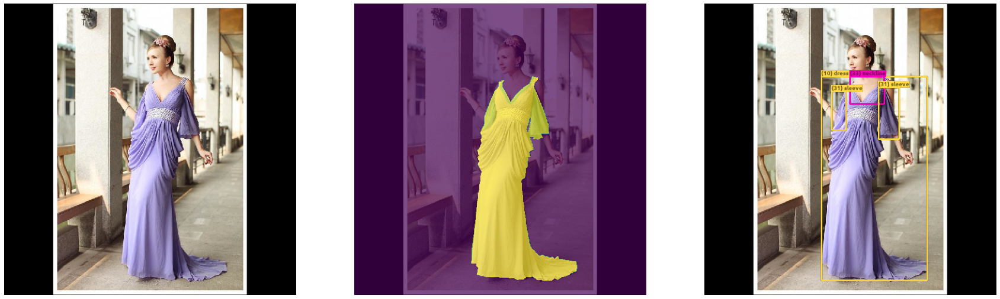

memory.used [MiB], memory.free [MiB], memory.total [MiB]
836 MiB, 7143 MiB, 7979 MiB


In [4]:
reload_external_packages()

target_dim = (2 ** 6) * 8  # it is vital that the image size will be devisiable by 2 at least 5 times
font = bbx.get_font_with_size(10)
print("Setting target_dim to [{}]".format(target_dim))


# generate a map from the class id to the label
def get_label(class_id):
    if allowed_classes is not None:
        class_id = allowed_classes[class_id]
    class_name = categories_df.loc[class_id]['name']
    label = class_name
    if ',' in class_name:
        label = class_name.split(',')[0]
    label = "(" + str(class_id) + ") " + label
    return label


def get_image_bounding_boxes(width, height, bounding_boxes, labels, decode_labels=True):
    image_with_bb = np.zeros((target_dim, target_dim, 3))
    for box, class_id in zip(bounding_boxes, labels):
        class_id = class_id.cpu().numpy()
        bbx.add(image_with_bb, *box, label=(get_label(class_id) if decode_labels else str(class_id)), font=font)

    # creating the alpha channel for the bounding box image (to avoid obscuring the original image with black background)
    bb_alpha = np.array(np.max(image_with_bb[:,:,:] > 0, axis=2) > 0, dtype=int)
    bb_alpha = bb_alpha * 255
    image_with_bb = np.concatenate((image_with_bb, bb_alpha.reshape(bb_alpha.shape[0], bb_alpha.shape[1], 1)), axis=2)
    image_with_bb = np.array(image_with_bb, dtype=int)
    return image_with_bb


def remove_empty_masks(labels, masks, bounding_boxes):
    indices_to_keep_masks = []  # empty array with 1 dim
    idx = 0
    for mask in masks:
        if torch.max(mask).cpu().numpy() == 1:
            indices_to_keep_masks.append(idx)
        idx += 1

    indices_to_keep_bbx = []  # empty array with 1 dim
    idx = 0
    for box in bounding_boxes:
        if ((box[3] - box[1]) > 0) and ((box[2] - box[0]) > 0):
            indices_to_keep_bbx.append(idx)
        idx += 1

    # TODO(ofekp): remove segments that have an area less than some thresholds (e.g. image id '361cc7654672860b1b7c85fe8e92b38a')

    indices_to_keep = torch.tensor(list(set(indices_to_keep_masks) & set(indices_to_keep_bbx)), dtype=int)
    return labels[indices_to_keep], masks[indices_to_keep], bounding_boxes[indices_to_keep]


def show_image_data_ground_truth(data_df, image_id, figsize=(30, 30)):
    # Get the an image id given in the training set for visualization
    vis_df = data_df[data_df['ImageId'] == image_id]
    vis_df = vis_df.reset_index(drop=True)
    class_ids = worker.get_labels(vis_df)
    masks = worker.get_masks(vis_df, target_dim=target_dim)
    bounding_boxes = worker.get_bounding_boxes(vis_df, masks)
    class_ids, masks, bounding_boxes = remove_empty_masks(class_ids, masks, bounding_boxes)
    # img = mpimg.imread(get_image_path(image_id))
    img = Image.open(get_image_path(image_id)).convert("RGB")
    img = worker.rescale(img, target_dim=target_dim)
    show_image_data(img, class_ids, masks, bounding_boxes, figsize=figsize)


def show_image_data(img, class_ids, masks, bounding_boxes, figsize=(30, 30)):
    width = masks[0].shape[1]
    height = masks[0].shape[0]
    image_with_bb = get_image_bounding_boxes(width, height, bounding_boxes, class_ids)
    
    # generate the segments mask with colors
    mask = torch.zeros((target_dim, target_dim))
    for i, (curr_mask, class_id) in enumerate(zip(masks, class_ids)):
        curr_mask = curr_mask.cpu()
        class_id = class_id.cpu()
        assert torch.min(curr_mask) >= 0.0
        assert torch.max(curr_mask) <= 1.0
        curr_mask = curr_mask.type(torch.FloatTensor)
        mask = torch.where(curr_mask == 0, mask, curr_mask * (255 - 4 * class_id))
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=figsize)
    ax[0].imshow(img.permute(1, 2, 0))
    ax[0].axis('off')
    ax[1].imshow(img.permute(1, 2, 0))
    ax[1].imshow(mask, alpha=0.7)
    ax[1].axis('off')
    ax[2].imshow(img.permute(1, 2, 0))
    ax[2].imshow(image_with_bb)
    ax[2].axis('off')
    plt.show()


image_id = train_df.iloc[16]['ImageId']
# image_id = '000b3ec2c6eaffb491a5abb72c2e3e26'
# image_id = '0066d8d66ec36bdb91592fdc4aa17ed9'
# image_id = '029720c77ebda81f6a57efd7a34df406'
# image_id = 'd3602308d5894f1a6ee0632a98321ca3'
# image_id = '361cc7654672860b1b7c85fe8e92b38a'
# image_id = '0000fe7c9191fba733c8a69cfaf962b7'
show_image_data_ground_truth(train_df, image_id)

!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

In [94]:
a = np.random.rand(2,3)
print(a)
a.reshape(-1)

b = torch.randn(2,3)
b.reshape(-1)
b.reshape((2,3))

[[0.6309592  0.98092368 0.87490255]
 [0.45183625 0.70846087 0.77746875]]


tensor([[ 0.8787, -1.1240,  1.3235],
        [-1.0381,  0.0692,  0.4957]])

# Prepare the data


In [5]:
from worker import worker


def dump_queue(queue):
    """
    Empties all pending items in a queue and returns them in a list.
    """
    result = []

    for i in iter(queue.get, 'STOP'):
        result.append(i)
    time.sleep(.1)
    return result

# consider other package than pickle to save the processed data to disk
# refer to https://stackoverflow.com/questions/28068872/memoryerror-with-pickle-in-python
# for pickle refer to https://stackoverflow.com/questions/17098654/how-to-store-a-dataframe-using-pandas
if __name__ == '__main__':
    image_ids = train_df['ImageId'].unique()
    num_of_cores = multiprocessing.cpu_count()
    num_of_cores = 2
    lock = Lock()
    global_counter = Value('i', 0)
    q = Queue()
    skipped_images = Queue()
    
    jobs = []
    image_ids = image_ids[1:20]
    for image_ids_set in np.array_split(image_ids, num_of_cores):
        p = Process(target=worker, args=(q,skipped_images,train_df,lock,global_counter,image_ids_set))
        p.daemon = True
        jobs.append(p)
        
    for p in jobs:
        p.start()
        
    while global_counter.value < len(image_ids):
        print(global_counter.value)
        time.sleep(2.0)

    arr = dump_queue(q)
    print(arr)
    
    skipped = dump_queue(skipped_images)
    print(skipped)
        
    for p in jobs:
        p.join()
        
    print('Done')

Process Process-1:
Traceback (most recent call last):
  File "/home/ofekp/miniconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
Process Process-2:
  File "/home/ofekp/miniconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
TypeError: worker() missing 1 required positional argument: 'skipped_images'
  File "/home/ofekp/miniconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/home/ofekp/miniconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
TypeError: worker() missing 1 required positional argument: 'skipped_images'


0
0
0


KeyboardInterrupt: 

In [ ]:
import worker as worker

# reloads the package with changes
import importlib
importlib.reload(worker)

from pathlib import Path
processed_data_folder_path = main_folder_path + "/processed_data/"
Path(processed_data_folder_path).mkdir(parents=True, exist_ok=True)

image_ids = train_df['ImageId'].unique()
image_ids = image_ids[1:20]
lock = Lock()
global_counter = Value('i', 0)
skipped_images = Queue()
worker.worker(processed_data_folder_path, 0, image_ids, train_df, lock, global_counter, skipped_images)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


MemoryError: 

# Dataloader

In [12]:
reload_external_packages()


def inc_by(lock, counter, val):
    lock.acquire()
    try:
        counter.value += val
    finally:
        lock.release()


def get_transform(train):
    transforms = []
#     transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)


class IMATDataset(BaseDataset):
    def __init__(self, data_df, transforms=None):
        self.transforms = transforms
        self.data_df = data_df
        self.image_ids = data_df['ImageId'].unique()
        self.skipped_images = []
        self.lock = Lock()
        self.images_processed = Value('i', 0)
        self.total_process_time = Value('f', 0.0)
        self.total_image_load_time = Value('f', 0.0)
        # TODO: indices = torch.randperm(len(dataset)).tolist()
        
    def show_stats(self):
        images_processed = self.images_processed.value
        total_process_time = self.total_process_time.value
        avg_time_per_image = 0 if images_processed == 0 else total_process_time / images_processed
        total_image_load_time = self.total_image_load_time.value
        avg_image_load_time = 0 if images_processed == 0 else total_image_load_time / images_processed
        print("Processed [{}] images in [{}] seconds. Avg of [{}] per image. Avg image load time [{}]".format(
            images_processed,
            total_process_time,
            avg_time_per_image,
            avg_image_load_time))
    
    def __getitem__(self, idx):
        start = time.time()
        image_id = self.image_ids[idx]
        vis_df = self.data_df[self.data_df['ImageId'] == image_id]
        vis_df = vis_df.reset_index(drop=True)
        labels = worker.get_labels(vis_df)
        try:
            masks = worker.get_masks(vis_df, target_dim=target_dim)
            for mask in masks:
                assert not torch.any(torch.isnan(mask))
                assert len(mask.nonzero()) == torch.sum(mask)  # check only ones and zeros
        except Exception as e:
            self.skipped_images.append(image_id)
            print("ERROR: Skipped image with id [{}] due to a mask exception [{}]".format(image_id, e))
            return
        boxes = worker.get_bounding_boxes(vis_df, masks)
        try:
            for box in boxes:
                assert not torch.any(torch.isnan(box))
        except Exception as e:
            self.skipped_images.append(image_id)
            print("ERROR: Skipped image with id [{}] due to a BB exception [{}]".format(image_id, e))
            return
        
        num_objs = len(labels)

        image_id_idx = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        labels, masks, boxes = remove_empty_masks(labels, masks, boxes)

        target = {}
        target["labels"] = labels + 1  # refer to fast_collate, this is needed for efficient det
        target["masks"] = masks
        target["boxes"] = boxes
        target["image_id"] = image_id_idx
        target["area"] = area
        target["iscrowd"] = iscrowd

        image_load_start_ts = time.time()
        image_orig = Image.open(get_image_path(image_id)).convert("RGB")
        # image = mpimg.imread(get_image_path(image_id))
        image = worker.rescale(image_orig, target_dim=target_dim)
        image_load_end_ts = time.time()
        inc_by(self.lock, self.total_image_load_time, image_load_end_ts - image_load_start_ts)
        if self.transforms is not None:
            image, target = self.transforms(image, target)
        
        # TODO(ofekp): make sure that this makes sense!
        # TODO(ofekp): check what happens here when the image is < target_dim. What will worker.py scale method do to the image in this case?
        target["img_size"] = image_orig.size[-2:] if target_dim is None else (target_dim, target_dim)
        image_orig_max_dim = max(target["img_size"])
        img_scale = target_dim / image_orig_max_dim
        target["img_scale"] = 1. / img_scale  # back to original size

        end = time.time()
        inc_by(self.lock, self.images_processed, 1)
        inc_by(self.lock, self.total_process_time, end - start)
        # print('.', end='')  # no newline
        assert image.shape[0] <= target_dim and image.shape[1] <= target_dim and image.shape[2] <= target_dim
        return image, target

    def __len__(self):
        return len(self.image_ids)
    
!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

memory.used [MiB], memory.free [MiB], memory.total [MiB]
1828 MiB, 6151 MiB, 7979 MiB


In [10]:
sizes = [(1,2),
         (2,3),
         (3,4),
         (4,5),
         (5,6)]

images = torch.rand(5,3,20,20)
ss = torch.tensor([[image.shape[1] / size[0], image.shape[2] / size[1]] for image, size in zip(images, sizes)])
print(ss.shape)
for t in ss:
    print(t)

torch.Size([5, 2])
tensor([20., 10.])
tensor([10.0000,  6.6667])
tensor([6.6667, 5.0000])
tensor([5., 4.])
tensor([4.0000, 3.3333])


# Sanity check for dataloader

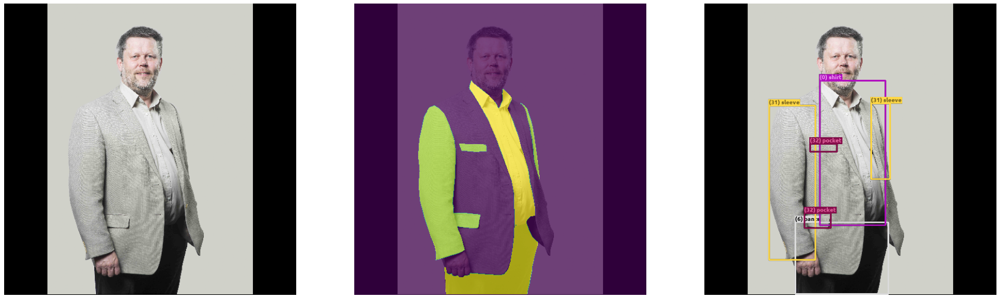

tensor([20538., 29210., 21951.,   658.,  1196.,  4389.])
tensor([2, 0, 8, 9, 9, 8])


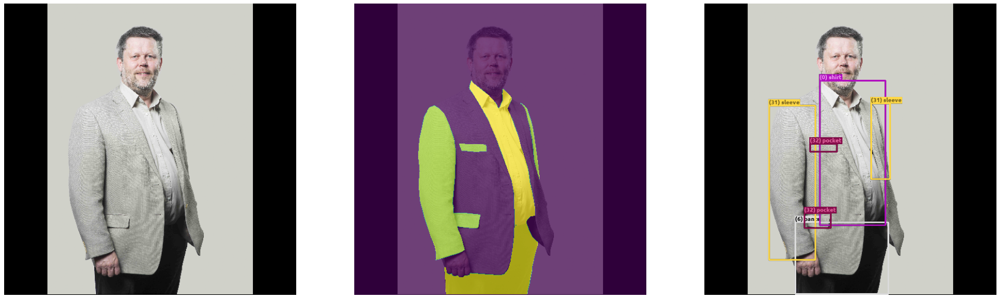

tensor([20538., 29210., 21951.,   658.,  1196.,  4389.])
tensor([2, 0, 8, 9, 9, 8])


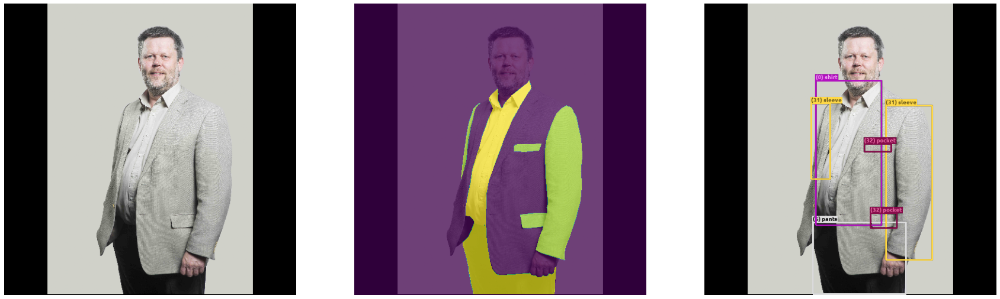

tensor([20538., 29210., 21951.,   658.,  1196.,  4389.])
tensor([2, 0, 8, 9, 9, 8])


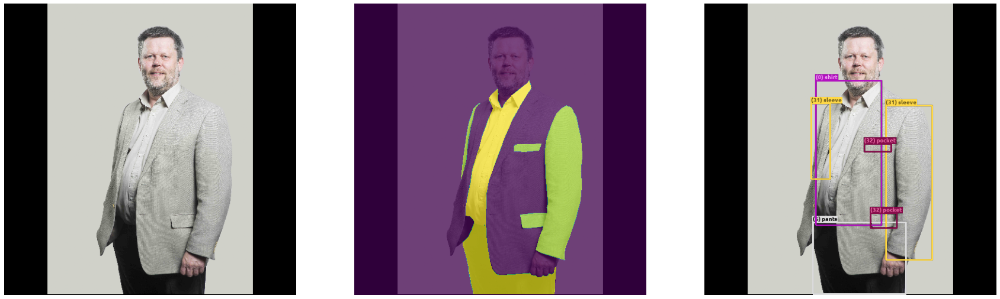

tensor([20538., 29210., 21951.,   658.,  1196.,  4389.])
tensor([2, 0, 8, 9, 9, 8])
400
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
torch.Size([3, 512, 512])
1.0
Processed [10] images in [2.0121750831604004] seconds. Avg of [0.20121750831604004] per image. Avg image load time [0.057509422302246094]


In [6]:
reload_external_packages()

# check transforms
for i in range(4):
    dataset = IMATDataset(train_df, get_transform(train=True))
    for i, (img, target) in enumerate(dataset):
        show_image_data(img, target['labels'], target['masks'], target['boxes'])
        print(target['area'])
        print(target['labels'])
        break

# check stats
dataset = IMATDataset(train_df, get_transform(train=True))
print(len(dataset))
for i, (img, target) in enumerate(dataset):
    print(img.shape)  # print the shape of the image
#     print(d)
#     print(d[1]['boxes'].shape)
#     print(d[1]['labels'].shape)
#     print(d[1]['masks'].shape)
#     print(d[1]['area'].shape)
    print(target['img_scale'])
    if i == 9:
        break
dataset.show_stats()
# split the dataset in train and test set
# indices = torch.randperm(len(dataset)).tolist()
# dataset = torch.utils.data.Subset(dataset, indices[:-50])

# Sanity check for remove_empty_masks

In [ ]:
list_of_images = ["001b385ce6556a41698fe91297fe2306","0067a38b32bcafdd211c3ad163a890dd","00e1237a5df0af757a57719262759d0a","0066d8d66ec36bdb91592fdc4aa17ed9"]
for image_id in list_of_images:
    target_dim = None#(2 ** 6) * 8  # it is vital that the image size will be devisiable by 2 at least 5 times
    show_image_data_ground_truth(train_df, image_id)
    target_dim = (2 ** 6) * 8  # it is vital that the image size will be devisiable by 2 at least 5 times
    show_image_data_ground_truth(train_df, image_id)

In [57]:
a = torch.randn(2, 3, 3)
print(a)
print(a.flip(-1))

tensor([[[-0.0222,  0.4088, -0.9311],
         [-0.3578,  0.4022, -0.4458],
         [ 0.7901, -0.6016,  0.1162]],

        [[-1.7028,  3.2745,  1.1072],
         [-2.7737,  0.6863, -0.8190],
         [ 0.3579,  0.6317, -1.1058]]])
tensor([[[-0.9311,  0.4088, -0.0222],
         [-0.4458,  0.4022, -0.3578],
         [ 0.1162, -0.6016,  0.7901]],

        [[ 1.1072,  3.2745, -1.7028],
         [-0.8190,  0.6863, -2.7737],
         [-1.1058,  0.6317,  0.3579]]])


# segmentation_models_pytorch

In [ ]:
!pip install -U segmentation_models_pytorch

import segmentation_models_pytorch as smp
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
# model = smp.Unet('efficientnet-b7', classes=num_classes, activation='softmax')

# replace the classifier with a new one, that has
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to C:\Users\ofekp/.cache\torch\checkpoints\fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


In [10]:
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
# FasterRCNN needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios
anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be [0]. More generally, the backbone should return an
# OrderedDict[Tensor], and in featmap_names you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=[0],
                                                output_size=7,
                                                sampling_ratio=2)

# put the pieces together inside a FasterRCNN model
model = FasterRCNN(backbone,
                   num_classes=2,
                   rpn_anchor_generator=anchor_generator,
                   box_roi_pool=roi_pooler)

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /home/ofekp/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


# Load a saved model (optional)


In [25]:
# load a saved model
epoch = 49

full_path = get_model_file_path(epoch)
model = torch.load(full_path)
model.eval()
model.to(device)

epoch_offset = epoch + 1  # so that in the next save we will not override this model

print("Loaded model file [{}]".format(full_path))

Loaded model file [../Code/Model/instseg_dim_500_images_500_classes_11_grad_accu_epoch_49.model]


# Or get a new empty model (pretrained on COCO)

In [10]:
def get_model_instance_segmentation(num_classes):
    from ipywidgets import FloatProgress
    # load an instance segmentation model pre-trained pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)
    return model


class EfficientDetBB(nn.Module):

    def __init__(self, config, norm_kwargs=None, pretrained_backbone=True, alternate_init=False):
        super(EfficientDetBB, self).__init__()
        norm_kwargs = norm_kwargs or dict(eps=.001, momentum=.01)
#         self.backbone = create_model(
#             config.backbone_name, features_only=True, out_indices=(2, 3, 4),
#             pretrained=pretrained_backbone, **config.backbone_args)
#         feature_info = [dict(num_chs=f['num_chs'], reduction=f['reduction'])
#                         for i, f in enumerate(self.backbone.feature_info())]

        act_layer = get_act_layer(config.act_type)
#         self.fpn = effdet.BiFpn(config, feature_info, norm_kwargs=norm_kwargs, act_layer=act_layer)
        self.class_net = effdet.HeadNet(config, num_outputs=config.num_classes, norm_kwargs=norm_kwargs, act_layer=act_layer)
        self.box_net = effdet.HeadNet(config, num_outputs=4, norm_kwargs=norm_kwargs, act_layer=act_layer)

        for n, m in self.named_modules():
            if 'body' not in n and 'backbone' not in n:
                if alternate_init:
                    effdet._init_weight_alt(m, n)
                else:
                    effdet._init_weight(m, n)

    def forward(self, x):
#         x = self.backbone(x)
#         x = self.fpn(x)
        x_class = self.class_net(x)
        x_box = self.box_net(x)
        return x_class, x_box

    
class BackboneWithCustomFPN(nn.Module):
    """
    Adds a FPN on top of a model.
    Internally, it uses torchvision.models._utils.IntermediateLayerGetter to
    extract a submodel that returns the feature maps specified in return_layers.
    The same limitations of IntermediatLayerGetter apply here.
    Arguments:
        backbone (nn.Module)
        return_layers (Dict[name, new_name]): a dict containing the names
            of the modules for which the activations will be returned as
            the key of the dict, and the value of the dict is the name
            of the returned activation (which the user can specify).
        in_channels_list (List[int]): number of channels for each feature map
            that is returned, in the order they are present in the OrderedDict
        out_channels (int): number of channels in the FPN.
    Attributes:
        out_channels (int): the number of channels in the FPN
    """
#     def __init__(self, config, backbone, return_layers, in_channels_list, out_channels):
    def __init__(self, config, backbone, return_layers, out_channels, alternate_init=False):
        super(BackboneWithCustomFPN, self).__init__()
#         self.body = effdet.IntermediateLayerGetter(backbone, return_layers=return_layers)
        self.body = backbone
#         self.fpn = FeaturePyramidNetwork(
#             in_channels_list=in_channels_list,
#             out_channels=out_channels,
#             extra_blocks=LastLevelMaxPool(),
#         )
        # fpn taken from efficientDet
    
        # Assigned to [niv]
        # TODO(ofekp): in colab we cannot read 'backbone.feature_info' so I switched to `backbone.feature_info()` but this gives 5
        #              features and not 3 as it should... We need to find out why this happens, for now, this is what it should return
        #              note that this is only true for 'tf_efficientdet_d5'!
        if is_colab:
            feature_info = [{'num_chs': 64, 'reduction': 8}, {'num_chs': 176, 'reduction': 16}, {'num_chs': 512, 'reduction': 32}]
        else:
            feature_info = [dict(num_chs=f['num_chs'], reduction=f['reduction'])
                            for i, f in enumerate(backbone.feature_info if is_colab else backbone.feature_info())]
        norm_kwargs = dict(eps=.001, momentum=.01)
        act_layer = get_act_layer(config.act_type)
        self.fpn = effdet.BiFpn(config, feature_info, norm_kwargs=norm_kwargs, act_layer=act_layer)
        self.out_channels = out_channels
        
        for n, m in self.named_modules():
            if 'body' not in n and 'backbone' not in n:  # avoid changing the weights of the backbone which is pretrained
                if alternate_init:
                    effdet._init_weight_alt(m, n)
                else:
                    effdet._init_weight(m, n)

    def forward(self, x):
        # x = torch.Size([2, 3, 512, 512]) - 2 is the batch size, 3 is num of image channels
        x = self.body(x)  # len(x) = 3
        x = self.fpn(x)
        # at this point x is an OrderedDict of features
        return x


# def efficientnet_fpn_backbone(config, pretrained_backbone, norm_layer=misc_nn_ops.FrozenBatchNorm2d, trainable_layers=3):
def efficientnet_fpn_backbone(config, pretrained_backbone):
    """
    Constructs a specified ResNet backbone with FPN on top. Freezes the specified number of layers in the backbone.
    Examples::
        >>> from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
        >>> backbone = resnet_fpn_backbone('resnet50', pretrained=True, trainable_layers=3)
        >>> # get some dummy image
        >>> x = torch.rand(1,3,64,64)
        >>> # compute the output
        >>> output = backbone(x)
        >>> print([(k, v.shape) for k, v in output.items()])
        >>> # returns
        >>>   [('0', torch.Size([1, 256, 16, 16])),
        >>>    ('1', torch.Size([1, 256, 8, 8])),
        >>>    ('2', torch.Size([1, 256, 4, 4])),
        >>>    ('3', torch.Size([1, 256, 2, 2])),
        >>>    ('pool', torch.Size([1, 256, 1, 1]))]
    Arguments:
        backbone_name (string): resnet architecture. Possible values are 'ResNet', 'resnet18', 'resnet34', 'resnet50',
             'resnet101', 'resnet152', 'resnext50_32x4d', 'resnext101_32x8d', 'wide_resnet50_2', 'wide_resnet101_2'
        norm_layer (torchvision.ops): it is recommended to use the default value. For details visit:
            (https://github.com/facebookresearch/maskrcnn-benchmark/issues/267)
        pretrained (bool): If True, returns a model with backbone pre-trained on Imagenet
        trainable_layers (int): number of trainable (not frozen) resnet layers starting from final block.
            Valid values are between 0 and 5, with 5 meaning all backbone layers are trainable.
    """
    # TODO(ofekp): make sure to add batch normalization to efficient net if that is possible
#     backbone = resnet.__dict__[backbone_name](
#         pretrained=pretrained,
#         norm_layer=norm_layer)
    backbone = create_model(
               config.backbone_name, features_only=True, out_indices=(2, 3, 4),
               pretrained=pretrained_backbone, **config.backbone_args)
#                pretrained=pretrained_backbone, drop_path_rate=0.2)
    
#     # select layers that wont be frozen
#     assert trainable_layers <= 5 and trainable_layers >= 0
#     layers_to_train = ['layer4', 'layer3', 'layer2', 'layer1', 'conv1'][:trainable_layers]
#     # freeze layers only if pretrained backbone is used
#     for name, parameter in backbone.named_parameters():
#         if all([not name.startswith(layer) for layer in layers_to_train]):
#             parameter.requires_grad_(False)

#     return_layers = {'layer1': '0', 'layer2': '1', 'layer3': '2', 'layer4': '3'}
#     return_layers = {'conv_stem': '0', 'bn1': '1', 'act1': '2', 'blocks': '3'}  # print([name for name, _ in backbone.named_children()]), but I think the needed layers are actually not named, this is visible from printing the backbone model and from the use of out_indices in EffcientDet repo
    return_layers = {'2': '0', '3': '1', '4': '2'}
    out_channels = 288  # This is since the config of 'tf_efficientdet_d5' creates fpn outputs with num of channels = 288

#     in_channels_stage2 = backbone.inplanes // 8
#     in_channels_list = [
#         in_channels_stage2,
#         in_channels_stage2 * 2,
#         in_channels_stage2 * 4,
#         in_channels_stage2 * 8,
#     ]
#     out_channels = 256
#     return BackboneWithCustomFPN(config, backbone, return_layers, in_channels_list, out_channels)
    return BackboneWithCustomFPN(config, backbone, return_layers, out_channels)


def get_model_instance_segmentation_efficientnet(num_classes):    
    # let's make the RPN generate 5 x 3 anchors per spatial
    # location, with 5 different sizes and 3 different aspect
    # ratios. We have a Tuple[Tuple[int]] because each feature
    # map could potentially have different sizes and
    # aspect ratios
    anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
#     anchor_generator = AnchorGenerator(sizes=((64, 176, 512, 288, 288),),
                                       aspect_ratios=((0.5, 1.0, 2.0),))
    
    # let's define what are the feature maps that we will
    # use to perform the region of interest cropping, as well as
    # the size of the crop after rescaling.
    # if your backbone returns a Tensor, featmap_names is expected to
    # be [0]. More generally, the backbone should return an
    # OrderedDict[Tensor], and in featmap_names you can choose which
    # feature maps to use.
    # TODO(ofekp): follow where this is being used!
    roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=[0],
                                                    output_size=7,
                                                    sampling_ratio=2)
    # ofekp: note that roi_pooler is passed to box_roi_pooler in the MaskRCNN network and is not being used in roi_heads.py
    
    config = effdet.get_efficientdet_config('tf_efficientdet_d5')  # TODO(ofekp): use 'tf_efficientdet_d7'
    config.num_classes = num_classes  # TODO(ofekp): try to remove this!
    backbone = efficientnet_fpn_backbone(config, pretrained_backbone=True)  # TODO(ofekp): pretrained! # from the repo trainable_layers=trainable_backbone_layers=3
    
    mask_roi_pool = MultiScaleRoIAlign(
                featmap_names=[0, 1, 2, 3],
                output_size=14,
                sampling_ratio=2)
    
    model = MaskRCNN(backbone,
                     min_size=target_dim,
                     num_classes=num_classes,
                     mask_roi_pool=mask_roi_pool,
#                      rpn_anchor_generator=anchor_generator,
                     box_roi_pool=roi_pooler)
    
    efficientDetModel = EfficientDetBB(config)
    model.roi_heads.box_predictor = DetBenchTrain(efficientDetModel, config)
#     # get number of input features for the classifier
#     in_features = model.roi_heads.box_predictor.cls_score.in_features
#     print(in_features)
#     # replace the pre-trained head with a new one
#     model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
#     # get number of input features for the classifier
#     in_features = model.roi_heads.box_predictor.cls_score.in_features
#     # replace the pre-trained head with a new one
#     model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

#     # now get the number of input features for the mask classifier
#     in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
#     hidden_layer = 256  # TODO(ofekp): was 256
#     # and replace the mask predictor with a new one
#     model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)
    return model

# get the model using our helper function
# model = get_model_instance_segmentation(num_classes)
model = get_model_instance_segmentation_efficientnet(num_classes)
model.to(device)  # move model to the right device
!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv

epoch_offset = 0

memory.used [MiB], memory.free [MiB], memory.total [MiB]
1775 MiB, 6204 MiB, 7979 MiB


# Train

In [7]:
reload_external_packages()

save_every = 10


def show_prediction_on_img(dataset, dataset_df, img_idx, show_groud_truth=True):
    img, _ = dataset[img_idx]  # TODO(ofekp): should take from 'dataset_test'
#     img_formatted = img.mul(255).permute(1, 2, 0).byte().cpu().numpy()

    # put the model in evaluation mode
    with torch.no_grad():
        prediction = model([img.to(device)])
        
    print(img.shape)

    # class_ids, masks, boxes = remove_empty_masks(class_ids, masks, boxes)
    boxes = prediction[0]['boxes']
    class_ids = prediction[0]['labels']
    masks = prediction[0]['masks'][:, 0]
    if show_groud_truth:
        show_image_data_ground_truth(dataset_df, dataset.image_ids[img_idx])
    show_image_data(img, class_ids, masks, boxes)
    

def save_model(model_to_save, epoch):
#     if device != 'cpu':
#         model.to('cpu')
    full_path = get_model_file_path(epoch)
    torch.save(model_to_save, full_path)
#     model.to(device)
    print('Saved model to [{}]'.format(full_path))


# train on the GPU or on the CPU, if a GPU is not available
# device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# use our dataset and defined transformations
dataset = IMATDataset(train_df, get_transform(train=True))
dataset_test = IMATDataset(test_df, get_transform(train=False))

# split the dataset in train and test set
# indices = torch.randperm(len(dataset)).tolist()
# dataset = torch.utils.data.Subset(dataset, indices[:-50])
# dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=1, shuffle=False, num_workers=0,  # TODO(ofekp): shuffle=True!!!
    collate_fn=utils.collate_fn)  # TODO: num_workers was 4

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)  # TODO: num_workers was 4

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)  # TODO(ofekp): was lr=0.005
# and a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

num_epochs = 30
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    engine.train_one_epoch(model, optimizer, data_loader, device, epoch, gradient_accumulation_steps=8, print_freq=100)
    # update the learning rate
    lr_scheduler.step()
    if (epoch + epoch_offset) % save_every == 0:
        save_model(model, epoch_offset + epoch)
        dataset.show_stats()
        !nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv
        model.eval()
        show_prediction_on_img(dataset, train_df, 1, show_groud_truth=False)  # TODO(ofekp): This should be test_df and dataset_test
        # evaluate on the test dataset
        with torch.no_grad():
            engine.evaluate(model, data_loader_test, device=device)
    print("Epoch [{}/{}]".format(epoch + 1, num_epochs))

print("Saving model one last time")
save_model(model, epoch_offset + epoch)
dataset.show_stats()
!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv
model.eval()
show_prediction_on_img(dataset, train_df, 1, show_groud_truth=False)
# evaluate on the test dataset
with torch.no_grad():
    engine.evaluate(model, data_loader_test, device=device)
print("That's it!")

size before [torch.Size([512, 512])]
size after [torch.Size([512, 512])]
adding image size of [512X512]
tensor([1.])
Epoch: [0]  [  0/400]  eta: 0:09:02  lr: 0.000018  loss: 547.3633 (547.3633)  total_loss: 544.2294 (544.2294)  loss_mask: 2.4192 (2.4192)  loss_objectness: 0.6910 (0.6910)  loss_rpn_box_reg: 0.0236 (0.0236)  time: 1.3571  data: 0.6621  max mem: 2804


AssertionError: 

In [15]:
a = torch.tensor([[159., 384., 322., 510.],
                  [202., 135., 317., 389.],
                  [113., 179., 194., 450.],
                  [185., 246., 232., 260.],
                  [175., 368., 221., 394.],
                  [292., 175., 325., 308.]])
print(a)

b = torch.tensor([1,0,3,2])
_, inds = torch.sort(b)
print(torch.index_select(a, 1, torch.LongTensor([1,0,3,2])))

tensor([[159., 384., 322., 510.],
        [202., 135., 317., 389.],
        [113., 179., 194., 450.],
        [185., 246., 232., 260.],
        [175., 368., 221., 394.],
        [292., 175., 325., 308.]])
tensor([[384., 159., 510., 322.],
        [135., 202., 389., 317.],
        [179., 113., 450., 194.],
        [246., 185., 260., 232.],
        [368., 175., 394., 221.],
        [175., 292., 308., 325.]])


torch.Size([3, 512, 512])


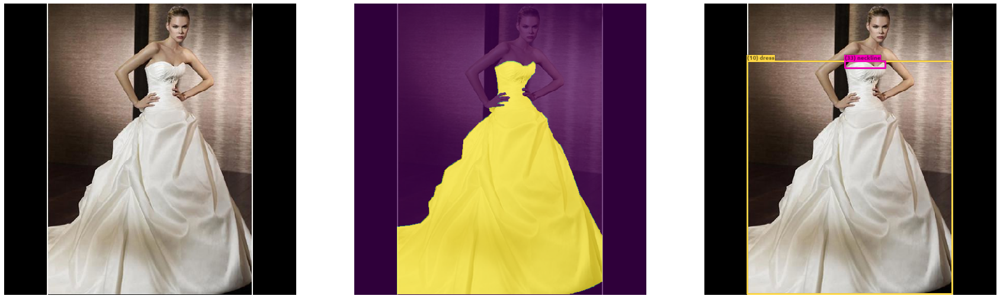

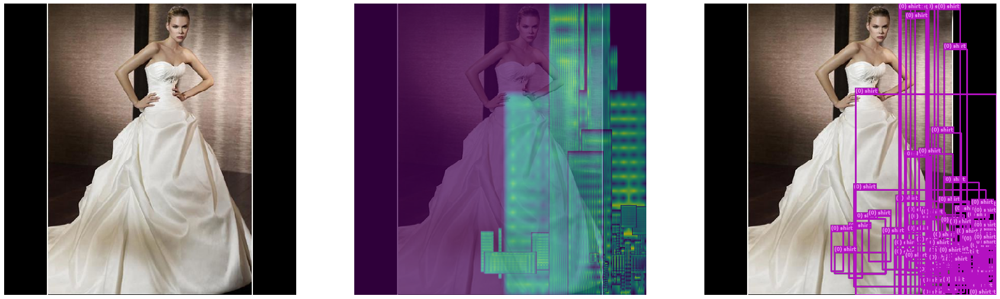

torch.Size([3, 512, 512])


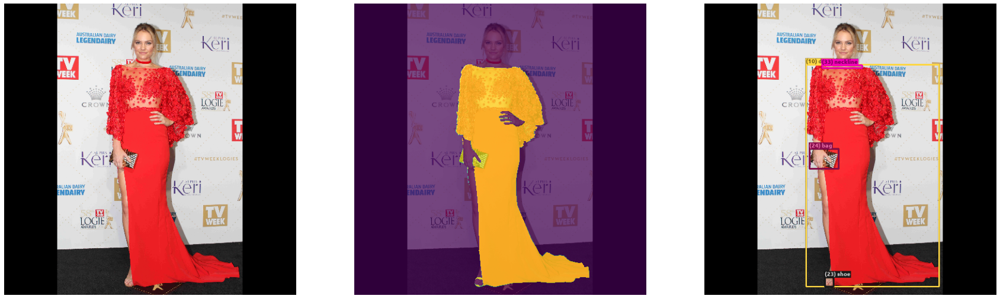

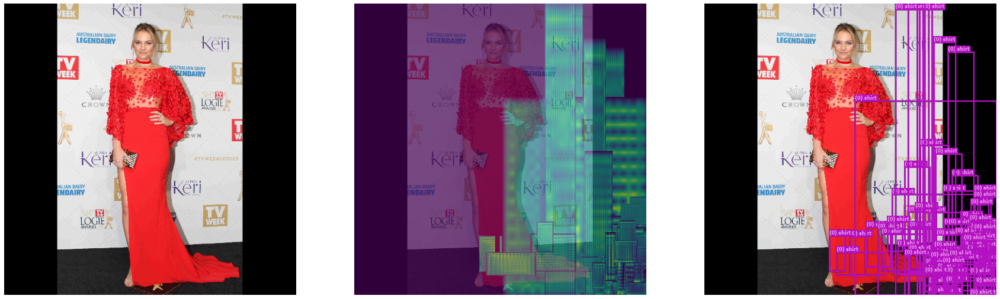

In [16]:
model.eval()
show_prediction_on_img(dataset, train_df, 3, show_groud_truth=True)
show_prediction_on_img(dataset_test, test_df, 3, show_groud_truth=True)
    

In [25]:
print(pickle.format_version)
from collections import OrderedDict

def save_model(model_to_save, epoch):
    full_path = get_model_file_path(epoch)
    torch.save(model_to_save, full_path)
    print('Saved model to [{}]'.format(full_path))

import sys
import resource
print(resource.getrlimit(resource.RLIMIT_STACK))
print(sys.getrecursionlimit())
sys.setrecursionlimit(3000)
print(sys.getrecursionlimit())
print(model)
epoch = 0
epoch_offset = 0
# print(model)
model.to('cpu')
save_model(model.state_dict(), epoch_offset + epoch)
model.to(device)
save_model(model.state_dict(), epoch_offset + epoch)
# save_model({"1":1}, epoch_offset + epoch)

4.0
(8388608, -1)
3000
3000
MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(512,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithCustomFPN(
    (body): EfficientNetFeatures(
      (conv_stem): Conv2dSame(3, 48, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn1): BatchNorm2d(48, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (act1): SwishMe()
      (blocks): Sequential(
        (0): Sequential(
          (0): DepthwiseSeparableConv(
            (conv_dw): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (bn1): BatchNorm2d(48, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (act1): SwishMe()
            (se): SqueezeExcite(
              (avg_pool): AdaptiveAvgPool2d(output_size=1)
              (conv_reduce): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
        

Saved model to [../Code/Model/instseg_dim_512_images_500_classes_11_grad_accu_epoch_0.model]


RecursionError: maximum recursion depth exceeded while calling a Python object

In [16]:
a = torch.tensor([10,10])
b = torch.tensor([3])
a.repeat(b, 1)

tensor([[10, 10],
        [10, 10],
        [10, 10]])

In [11]:
import gc
import sys
import traceback
# %tb
!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv
!free -h

# raise Exception("yes")
# 1/0

print(torchvision._is_tracing())

# %reset out
del model
model = None
data_loader = None
data_loader_test = None
gc.collect()

torch.cuda.empty_cache()
with torch.no_grad():
    torch.cuda.empty_cache()
!nvidia-smi --query-gpu=memory.used,memory.free,memory.total --format=csv
!free -h

memory.used [MiB], memory.free [MiB], memory.total [MiB]
7326 MiB, 653 MiB, 7979 MiB
              total        used        free      shared  buff/cache   available
Mem:            15G        8.8G        564M        719M        6.3G        5.8G
Swap:          2.0G         12M        2.0G
None
memory.used [MiB], memory.free [MiB], memory.total [MiB]
2360 MiB, 5619 MiB, 7979 MiB
              total        used        free      shared  buff/cache   available
Mem:            15G        8.8G        564M        719M        6.3G        5.8G
Swap:          2.0G         12M        2.0G


# Verify fast_collate

In [30]:
# ofekp - adding this method from https://github.com/rwightman/efficientdet-pytorch/blob/0b36cc1cccfe92febc64f6eb569ca4393bd73964/data/loader.py#L86
def fast_collate(batch):
    MAX_NUM_INSTANCES = 30
    batch_size = len(batch)

    # FIXME this needs to be more robust
    target = dict()
    for k, v in batch[0][1].items():
        if torch.is_tensor(v):
            target_shape = (batch_size, MAX_NUM_INSTANCES)
            if len(v.shape) > 1:
                target_shape = (batch_size, MAX_NUM_INSTANCES) + v.shape[1:]
            target_dtype = v.dtype
        elif isinstance(v, np.ndarray):
            # if a numpy array, assume it relates to object instances, pad to MAX_NUM_INSTANCES
            target_shape = (batch_size, MAX_NUM_INSTANCES)
            if len(v.shape) > 1:
                target_shape = target_shape + v.shape[1:]
            target_dtype = torch.float32
        elif isinstance(v, (tuple, list)):
            # if tuple or list, assume per batch
            target_shape = (batch_size, len(v))
            target_dtype = torch.float32 if isinstance(v[0], float) else torch.int32
        else:
            # scalar, assume per batch
            target_shape = batch_size
            target_dtype = torch.float32 if isinstance(v, float) else torch.int64
        target[k] = torch.zeros(target_shape, dtype=target_dtype)

#     tensor = torch.zeros((batch_size, *batch[0][0].shape), dtype=torch.uint8)
    for i in range(batch_size):
#         tensor[i] += torch.from_numpy((batch[i][0] * 255).astype('uint8'))
#         tensor[i] += torch.tensor(batch[i][0] * 255, dtype=torch.uint8)
        for tk, tv in batch[i][1].items():
            if torch.is_tensor(tv):
                target[tk][i, 0:tv.shape[0]] = tv
            elif isinstance(tv, np.ndarray) and len(tv.shape):
                target[tk][i, 0:tv.shape[0]] = torch.from_numpy(tv)
            else:
                target[tk][i] = torch.tensor(tv, dtype=target[tk].dtype)

    return batch[0], target


def my_fast_collate(targets):
    MAX_NUM_INSTANCES = 30
    batch_size = len(targets)

    # FIXME this needs to be more robust
    target = dict()
    for k, v in targets[0].items():
        if torch.is_tensor(v):
            target_shape = (batch_size, MAX_NUM_INSTANCES)
            if len(v.shape) > 1:
                target_shape = (batch_size, MAX_NUM_INSTANCES) + v.shape[1:]
            target_dtype = v.dtype
        elif isinstance(v, np.ndarray):
            # if a numpy array, assume it relates to object instances, pad to MAX_NUM_INSTANCES
            target_shape = (batch_size, MAX_NUM_INSTANCES)
            if len(v.shape) > 1:
                target_shape = target_shape + v.shape[1:]
            target_dtype = torch.float32
        elif isinstance(v, (tuple, list)):
            # if tuple or list, assume per batch
            target_shape = (batch_size, len(v))
            target_dtype = torch.float32 if isinstance(v[0], float) else torch.int32
        else:
            # scalar, assume per batch
            target_shape = batch_size
            target_dtype = torch.float32 if isinstance(v, float) else torch.int64
        target[k] = torch.zeros(target_shape, dtype=target_dtype)

    for i in range(batch_size):
        for tk, tv in targets[i].items():
            if torch.is_tensor(tv):
                target[tk][i, 0:tv.shape[0]] = tv
            elif isinstance(tv, np.ndarray) and len(tv.shape):
                target[tk][i, 0:tv.shape[0]] = torch.from_numpy(tv)
            else:
                target[tk][i] = torch.tensor(tv, dtype=target[tk].dtype)

    return target

# print(torch.randn(1).shape[0] == 2)
# print(len(torch.randn(3).shape))
    
# gg = torch.zeros((2, 10, 3), dtype=torch.float32)
# print(gg.shape[1:])
    
# zz = torch.zeros((2, 10, 3), dtype=torch.float32)
# print(zz)
# zz[1] = torch.randn(1, 3)
# print(zz)

# for gg in torch.split(x, 1, dim=0):
#     print("size is [{}]".format(gg.shape))


x = torch.randn(2,3,4,4)

ta = {
    'class': torch.randn(5),  # 5 instances for image 1
    'box': torch.randn(5, 4),
    'img_size': (11,11),
    'img_id': 0.6  # scalar
}
tb = {
    'class': torch.randn(6),  # 6 instances for image 2
    'box': torch.randn(6, 4),
    'img_size': (11,11),
    'img_id': 0.5  # scalar
}
t = [ta, tb]

# fast_collate((x, t))
# data_feed_to_efficient_net = fast_collate(tuple(zip(torch.split(x, 1, dim=0), t)))
data_feed_to_efficient_net = my_fast_collate(t)
print(data_feed_to_efficient_net)

{'class': tensor([[-1.0331,  0.8080,  0.6249,  1.2341,  1.5276,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 1.4356, -0.6419, -0.6730,  1.7239,  0.5397, -0.3325,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000]]), 'box': tensor([[[-0.5140,  0.3457, -0.9376, -0.3839],
         [ 0.1014,  1.0609, -0.2910,  0.9079],
         [-1.1037,  0.1650,  0.1322, -0.7430],
         [ 1.5191, -0.2088, -0.1250, -0.3899],
         [-1.4736,  2.0098,  0.7098, -0.0705],
         [ 0.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  

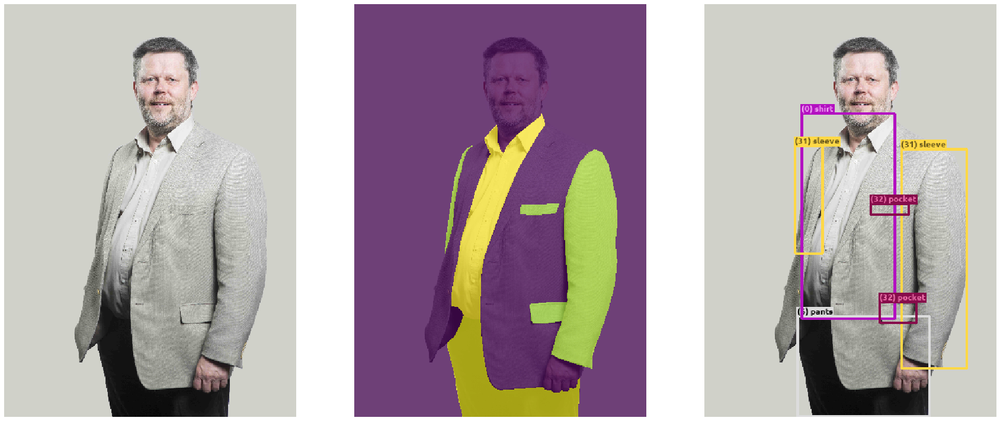

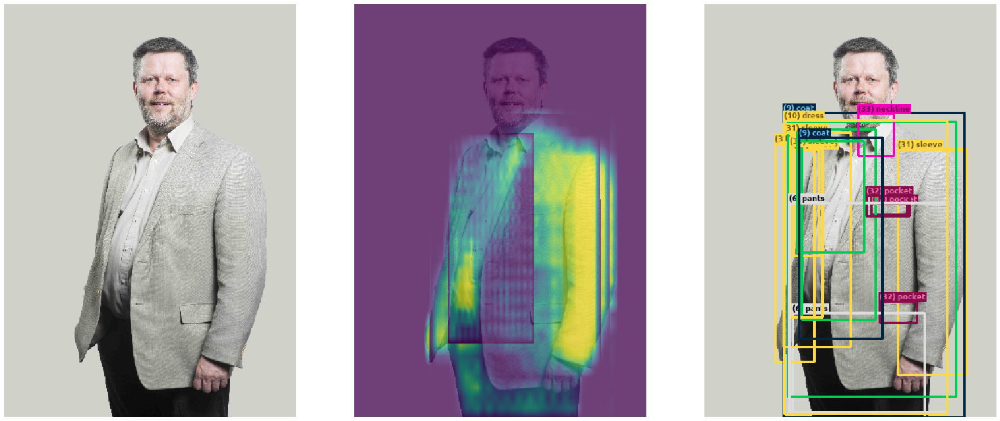

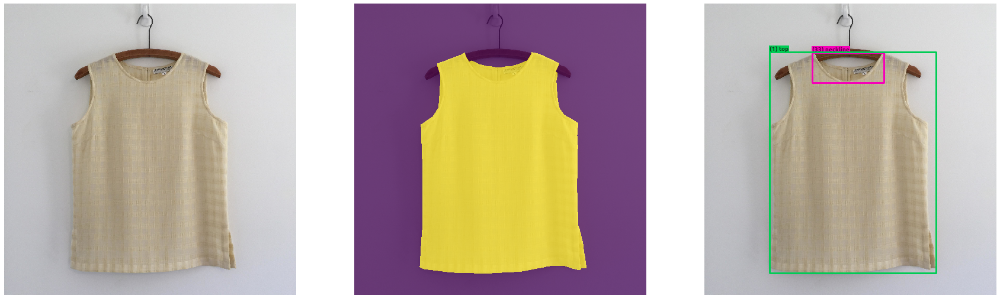

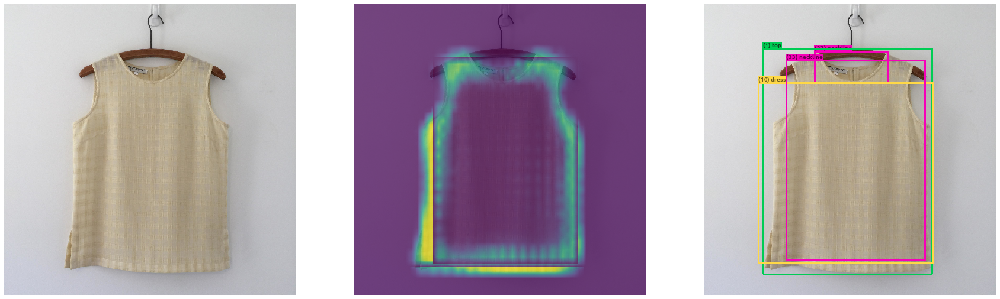

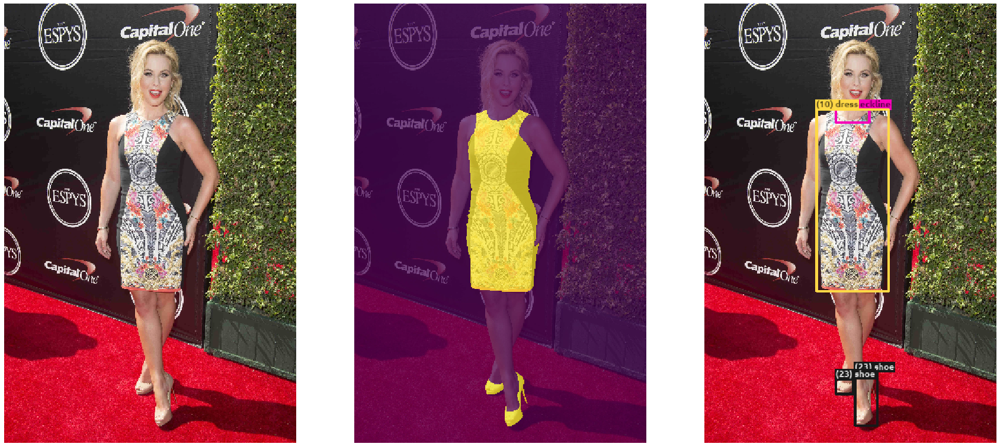

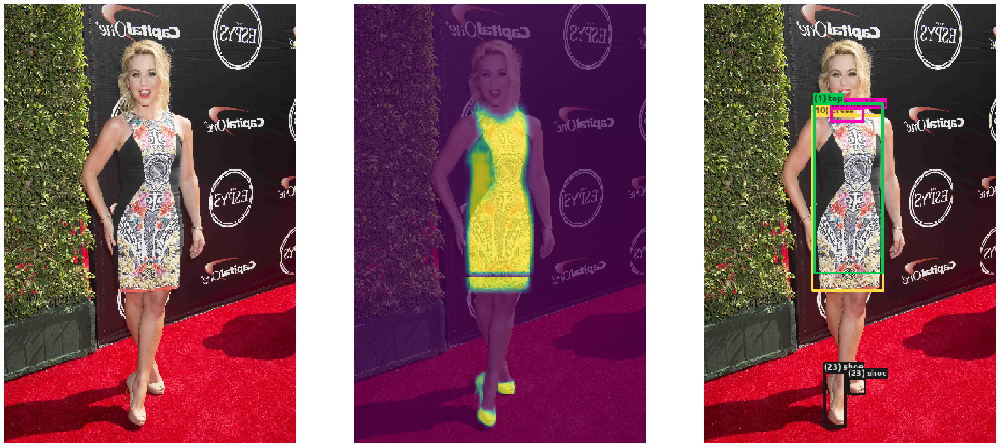

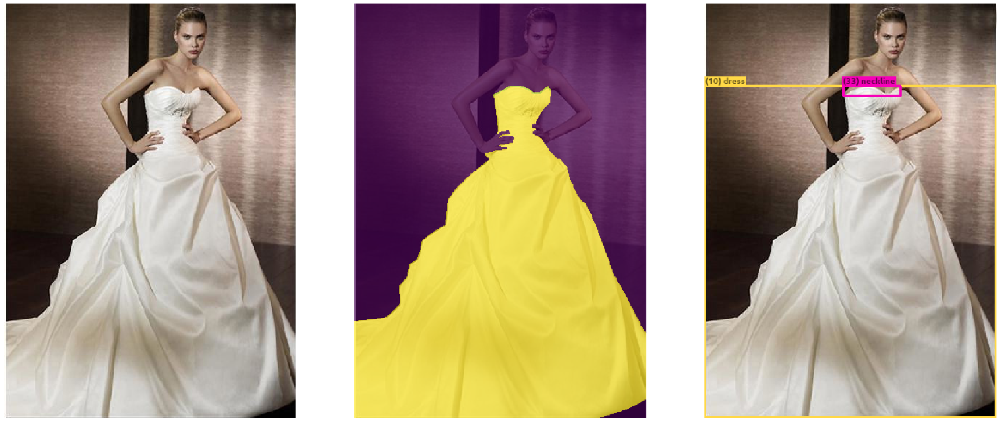

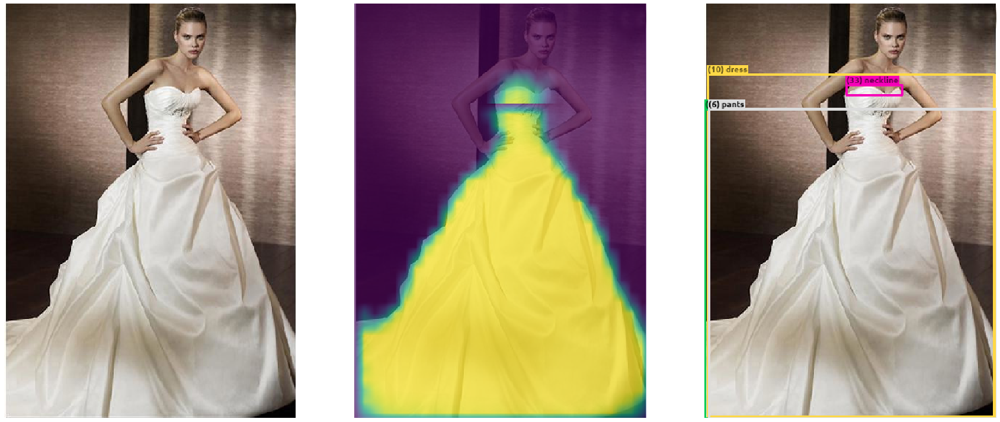

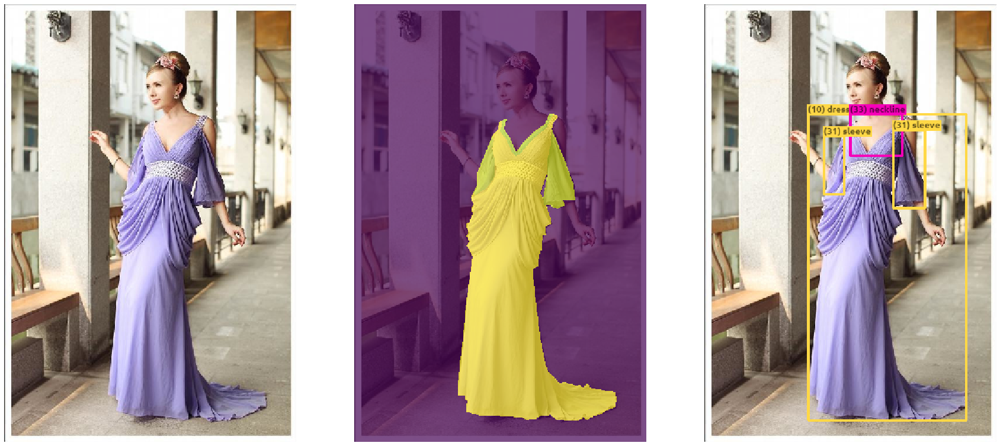

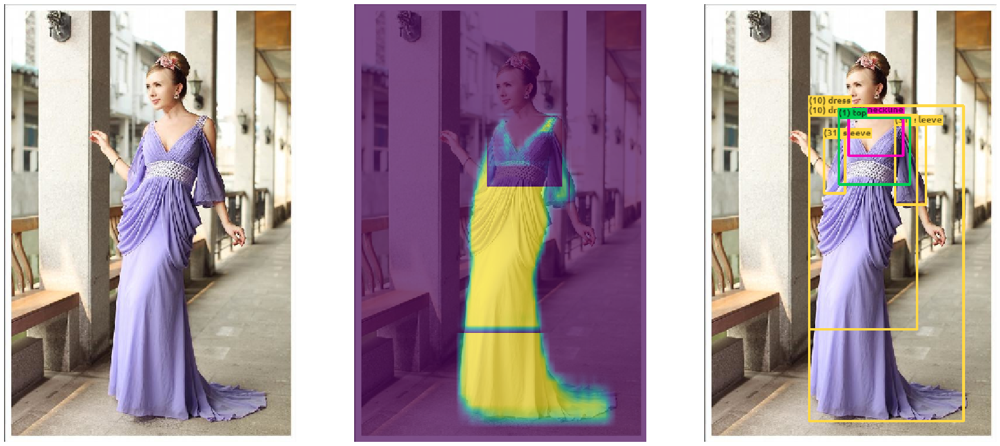

In [28]:
# device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
#model = get_model_instance_segmentation(2)
#model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
#model.to(device)

# load the saved model
# epoch = 1
# file_name = 'Code/Model/instseg_dim_' + str(target_dim) + '_images_' + str(limit_data) + '_epoch_' + str(epoch) + '.model'
# full_path = main_folder_path + file_name
# # model = TheModelClass(*args, **kwargs)
# model = torch.load(full_path)
# model.eval()
# model.to(device)

model.eval()

# use our dataset and defined transformations
dataset = IMATDataset(train_df, get_transform(train=True))
dataset_test = IMATDataset(test_df, get_transform(train=False))

# pick one image from the test set
img_indices = [0,1,2,3,4]
for img_idx in img_indices:
    show_prediction_on_img(dataset, train_df, img_idx)  # TODO(ofekp): This should be test_df and dataset_test

# References

## Tier 1 - Actually relevant
- Processing the data - https://www.kaggle.com/kaushal2896/imaterialist-2020-starter-eda-mask-rcnn
- TORCHVISION OBJECT DETECTION FINETUNING TUTORIAL - https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

## Tier 2 - Must reads (but did not read yet)
- Review: DeepMask (Instance Segmentation) - https://towardsdatascience.com/review-deepmask-instance-segmentation-30327a072339
- Semantic and Instance Segmentation on iOS Using a Flask API — DeepLabV3+ and Mask R-CNN - https://heartbeat.fritz.ai/semantic-and-instance-segmentation-on-ios-using-a-flask-api-deeplabv3-and-mask-r-cnn-b141213de3e7
- Guide to semantic segmentation - https://heartbeat.fritz.ai/a-2019-guide-to-semantic-segmentation-ca8242f5a7fc

## Tier 3 - To read or code helpers
- https://github.com/qubvel/segmentation_models.pytorch
- Guide to build Faster RCNN in PyTorch - https://medium.com/@fractaldle/guide-to-build-faster-rcnn-in-pytorch-95b10c273439
- Faster R-CNN: Down the rabbit hole of modern object detection - https://tryolabs.com/blog/2018/01/18/faster-r-cnn-down-the-rabbit-hole-of-modern-object-detection/
- EfficientNet-PyTorch - https://github.com/lukemelas/EfficientNet-PyTorch/blob/master/examples/imagenet/main.py
- Continue videos from Stanford - https://www.youtube.com/watch?v=6wcs6szJWMY
- Mask RCNN video - https://www.youtube.com/watch?v=4tkgOzQ9yyo

## Code references/examples
- Passageway detection, as an example for usage in pretrained model - https://github.com/orhaim/Passageway_Detection

## Articles to read
- Winner of the 2020 competition - https://www.kaggle.com/c/imaterialist-fashion-2020-fgvc7/discussion/154306
- MaskRCNN - https://arxiv.org/pdf/1703.06870.pdf (current leader in instance segmentation https://paperswithcode.com/task/instance-segmentation)
- EfficientDet - https://paperswithcode.com/paper/efficientdet-scalable-and-efficient-object (current leader in object detection https://paperswithcode.com/task/object-detection)

## Read articles
- EfficientNets - https://arxiv.org/pdf/1905.11946.pdf

## Keeping Colab active for long periods of time
- https://medium.com/@shivamrawat_756/how-to-prevent-google-colab-from-disconnecting-717b88a128c0

```
function ClickConnect(){
console.log("Working"); 
document.querySelector("colab-toolbar-button#connect").click() 
}
setInterval(ClickConnect,60000)
```

## Supporting argument for sharding the images into folders (stackoverflow)
- https://stackoverflow.com/questions/54660967/google-colab-having-problems-with-drive-folders-containing-lots-of-files

## Solve invalid notebook warning when importing ipynb file from Colab
- https://github.com/jupyter/nbformat/issues/166

## Gradient accumulation
This is useful since we do not have enough memory in the GPU, we do backprop only after a few batches were forwarded through the network, thereby, achieving more generalization, rather than backpropagating on every batnch
- https://gist.github.com/thomwolf/ac7a7da6b1888c2eeac8ac8b9b05d3d3

## Plot Neural Networks
- https://datascience.stackexchange.com/questions/14899/how-to-draw-deep-learning-network-architecture-diagrams
- https://github.com/HarisIqbal88/PlotNeuralNet


## Datasets (to be mentioned in the project article)

* COCO Dataset
 - https://cocodataset.org/#home
 - https://arxiv.org/pdf/1405.0312.pdf

* iMaterialist
 - https://arxiv.org/pdf/1906.05750.pdf
 
* Clothing1M Dataset
 - https://www.floydhub.com/lukasmyth/datasets/clothing1m
 
## Copying the Kaggle dataset to GCP instance
- We created an instance with 16GB RAM, Tesla K80 GPU and 250 GB SSD (no need for cloud storage)
- ssh to the host (browser ssh is enough)
- in Kaggle go to account and get a API key json file
- in /home/ofekpearl run `pip install kaggle` (without sudo!!!)
- `export KAGGLE_USERNAME=<user name from json file>`
- `export KAGGLE_KEY=<hash from json file>`
- `/opt/conda/bin/kaggle competitions download -c imaterialist-fashion-2020-fgvc7`
- for more information go to https://github.com/Kaggle/kaggle-api
 
## Solved Bugs

- out_channels = 288  # This is since the config of 'tf_efficientdet_d5' creates fpn outputs with num of channels = 288
- Image size needed to be devisable by 2 at leat 6 times
- Torch Vision expected the FPN to give a map, but EfficientDet BiFPN implementation returned the features as a list
- `anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),` in MaskRCNN did not work, so I used the default by setting `anchor_generator` to None. Don't understand yet why this happened
- EfficientDet fails on conv2d - this happened since EfficientDet does not use region proposal network, had to fork torchvision, move to linux and compile my version instead
- roi_heads.py in fastrcnn_loss(class_logits,... class_logits was a list and not a tensor and was given to F.cross_entropy which expects a tensor. Had to modify EfficientDet to return a tensor instead of a list.
- mismatch of vector sizes when calculating loss inside bench.py, it expected 160 as the image size and not 64 - 160 is 1280/2^3 and 64 is 512/2^3 so I just change in the efficient det config the image_size from 1280 to my setup which is 512.
- Scales in pooler.py of torchvision package in the MaskRCNN sampled few [0,1,2,3] but not all (excluded layer 4) of the features that came back from the FPN, but it used the names of the feature layers as strings and I remembered that I in EffcientNet (from timm package) that they actually used numbers, so I changed them to numbers by overriding mask_roi_pool in the MaskRCNN model creation.
- In bench.py when using GPU, few of the vectors were actually in CPU, I had to move them to the GPU manually, those are the by products of the my_fast_collate inside bench.py.
- Could not run 'torchvision::nms' with arguments from the 'CUDA' backend - https://github.com/pytorch/vision/issues/1916 (this issue is not related to my issue, they complain about missing nms not a that it can only work with CPU) - solution is to install CUDA drivers for Ubuntu, refer to https://docs.nvidia.com/cuda/cuda-installation-guide-linux/index.html. Sine Torch is compiled with Cuda 10.2 I actually need to download the same version of Cuda toolkit from here https://developer.nvidia.com/cuda-10.2-download-archive (and not the 11.0 version described in the guide) installation guide for 10.2 can be found here https://docs.nvidia.com/cuda/archive/10.2/cuda-installation-guide-linux/index.html#environment-setup. Also, I needed to compile examples with make -k (and not just make) refer to https://github.com/NVIDIA/cuda-samples/issues/22. PATH edit line can be added to ~/.profile in ubuntu. To set LD_LIBRARY_PATH in ubuntu refer to https://serverfault.com/questions/201709/how-to-set-ld-library-path-in-ubuntu/201710. After installing the drivers according to 10.2 guide, and unistalling previously installed drivers (sudo /usr/bin/nvidia-uninstall) and uninstalling previously installed cuda (sudo /usr/local/cuda-X.Y/bin/uninstall_cuda_X.Y.pl)
- Cannot save the model - pickle is running into Recurssion Error - this is probably a change that I made in torchvision, probably in generalized_rcnn, check out https://github.com/pytorch/vision/compare/master...ofekp:master - error gist https://gist.github.com/ofekp/d8dfdc4805cf80c79a01852f426583f3, for now found that if the model is moved to cpu before saving then it can be saved. Changed the method save_model. Solved! The issue was that I used reload_external_packages!!!! it made pickle fail!!! I added a return statement in the reload method to avoid this error completely. no need to move the model to the CPU!!! refer to this answer https://stackoverflow.com/a/1964942/4295037.
- object of type 'NoneType' has no len() - https://gist.github.com/ofekp/3403ddf4f4a3837eaa0f3d8bd01f9e49 + other issues with evaluation, follow how efficient det is using DetBenchTrain and DetBenchPredict from bench.py. Eventually made a change to both bench.py and ImageList to pass everything I need to address both eval and train in the same DetBenchTrain class + moved data to tensors.
- in poolers.py - TypeError: expected Tensor as element 0 in argument 0, but got list. Changed `"boxes": det[0:4].toList()` to `"boxes": det[0:4]`, then I got another error in poolers.py, see next bug.
- in poolers.py - IndexError: too many indices for tensor of dimension 1 - start by printing the boxes inside convert_to_roi_format (already compiled with print) - solved with more code in roi_heads.py
- [REVERTED THIS CHANGE, SOLVED DIFFERENTLY] transforms.py (torchvision) -  RuntimeError: CUDA error: device-side assert triggered. Error changed to "index 11 is out of bounds for dimension 1 with size 11" in roi_heads.py when running on CPU instead of GPU https://gist.github.com/ofekp/f201527209f37c561818969ed58cc693 for some reson the labels include the label 11 which is illegal since we only have 11 classes in this test. Need to make sure the labels start from 0 for efficient det and for torchvision. there may be a discrapency between them. Solved by removing the line `classes += 1  # back to class idx with background class = 0` from anchors.py. I had to revert this change since the model di not lear correclty, this was atually solved by changing the IMATDataset to return labels +1, refer to fixes in "model is not learning correctly" below.
- For small number of images, getting this error: "IndexError: index 8 is out of bounds for dimension 1 with size 8" this is related to how many classes were found. no sure how to solve, though. I solved it by replacing in the notebook:
```
num_classes = len(cut_data_df['ClassId'].unique())
```
with:
```
num_classes = None
if allowed_classes is None:
    num_classes = len(cut_data_df['ClassId'].unique())
else:
    num_classes = len(allowed_classes)
```
- in pycocotools/mask.py - "ValueError: Buffer dtype mismatch, expected 'uint8_t' but got 'float'" changed masks to uint8 in worker.py after they are rescaled
- Could not show the mask in my show_image_data method - I converted the mask from uint8 to float for the purpose of presenting it as an image
- engine.py - AttributeError: 'tuple' object has no attribute 'to' - added `k: v.to(device) if torch.is_tensor(v) else ` again to the line where target fields are moved to the device. This happened before int eh train method too, and it is because of img_size and img_scale that I added to the target map.
- `RuntimeError: The expanded size of the tensor (326) must match the existing size (0) at non-singleton dimension 0.  Target sizes: [326, 0].  Tensor sizes: [0, 0]` https://gist.github.com/ofekp/04af91da04cc612b6d03e05edb03aeb8 - changed efficientdet output to xyxy instead of xyhw (by commenting the code that converts to xyhw) - efficientdet->anchors.pt->generate_detections. I thought about it after observing the boxes tensor in torchvision->transform.py->postprocess which included many boxes in the form [512,0,0,0] seemed odd compared to boxes that did not cause any issues.
- <span style="color:red">TODO(ofekp):</span> model is not learning correctly:
  1. check previous model to see it is ok - did not see issues
  1. check the scaling method in torchvision and make sure the correct scales are saved in ImageList! - done
  1. check classes offsets in anchors.py of efficient det, we need to get to the bottom of this - I did and found that we were actually not doing it well, the classes should be given to the model in +1 format, since otherwise fast_collate in effdet would have zeros in wrong spots, it fust only have zeros at the end. I reverted changes that I made in effdet code which did classes+=1 and class_targets-=1 in two places (all in anchors.py)
  1. check xyxy yxyx xywh, in what format should the ound boxes be in each step of the way? - I found the correct way to use this. we used to convert from yxyx back to xyxy but effdet already did that so we actually returned yxyx again. fixed.
  1. if all else fails, we need to run the original efficient det code (Ross Wightman)! Then we need to run it with our dataloader!
  1. split the models, train only effdet to check
  1. read issues in effdet repo - I found references to https://www.kaggle.com/shonenkov/training-efficientdet which is an example for usage in effdet with a different dataset by Alex - made me change the network to what Alex did. I also found the load_pretrained method that loads the weights to the model from a checkpoint.
  1. ask in effdet repo [comment](https://github.com/rwightman/efficientdet-pytorch/issues/72) - got some good help there, including the fact that we should play with the .001 value to reduce the number of boxes we get from the model.
  
- <span style="color:red">TODO(ofekp):</span> cannot train the model with high lr value (lr=0.1) - https://gist.github.com/ofekp/8eb44b4ab6ab92fc4b6c5ebdaeac99d6

## TODOs
- [X] Try to fix the IO error since the train folder is very big - https://research.google.com/colaboratory/faq.html#drive-timeout - solution was to shard the images into folders
- [X] Make sure that transforms (get_transforms) is used correctly and find out if it is not making the data wrong! Check that the labels are in the correct order after applying the transforms!
- [X] save_model should move the model to cpu when saving, try to avoid that! [SOLVED] importlib was the problem with Recursion error of pickle!
- [ ] Change resize to achieve a target size which is divisable by at least 2^6 (6 is the number of layers), refet to https://github.com/rwightman/efficientdet-pytorch/blob/91f517228db2af8be89cf38a35905ec5db104f2c/data/transforms.py
- [ ] in bench.py try to avoid getting the device again and avoid moving the tensors produced by my_fast_collate to the device again!
- [ ] Try to use EfficientNet or EfficientDet in the model (probably for object detection)
- [ ] Are we using dropout
- [ ] Does using gradient accumulation help? we might want to conduct a comparison.
- [ ] Try to use transforms [Resize](https://pytorch.org/docs/stable/torchvision/transforms.html#torchvision.transforms.Resize) method instead of my rescale method
- [ ] effcient det repo has a method `create_optimizer` which we should explore, it comes from timm repo
- [ ] find a better evaluation for MAX_NUM_INSTANCES in bench.py
- [ ] ask efficientdet torch repo owner why he did `classes += 1  # back to class idx with background class = 0` in anchors.py 
- [ ] first transform then rescale, currently we get images with black paddings on the left which is not good, also check if the padding should actually be on the right and bottom like Ross said in this [comment](https://github.com/rwightman/efficientdet-pytorch/issues/40#issuecomment-647661368)
- [ ] Keep reading suggestion in my effdet [comment](https://github.com/rwightman/efficientdet-pytorch/issues/72)
- [ ] find out how to move credit from one account to another in GCP
